In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!ls

drive  sample_data


In [3]:
!ls /content/drive/MyDrive/

'15000.00 To Finance Officer Sharnbasava University Placement Training Cell on Google Pay.png'
 4thsemresult.pdf
'52284b19-11b2-4dad-9b7a-35f5288358ae_1663171122 - 15000.00 To Finance Officer Sharnbasava University Placement Training Cell on Google Pay.png'
 5_6285308364201133151.pdf
 5thsem.pdf
'6TH NEW.gdoc'
'6TH NEW.pdf'
 Addharimageupload.pdf
 addharneww.jpg
 app-debug.apk
'Apti (CRT)'
 Apti_kodnest
'Baswaraj (1).pdf'
 Baswaraj.gdoc
 Baswaraj.pdf
 bhdxc.jpg
'bhima (1).gdoc'
'bhima (1).pdf'
'bhima (2).pdf'
'bhima (3).pdf'
'bhima (4).pdf'
'bhima (5).pdf'
 bhima.gdoc
 Bhima.jpg
 bhima.pdf
 Bhimaresume26j.pdf
 Bhimashankar_r_8310836989.docx
 BHIMASHANKAR_R.docx
 BHIMASHANKAR_R.gdoc
'Bhimashankar(SG19CSE039).pdf'
 bh.mp3
'BONAFIED AND RESULT DATA 5 sem.gsheet'
 buspassack.pdf
 certificate.pdf
'Colab Notebooks'
 confirmation.jpg
 Dataset_Project
 DIGILOCKER_DOCUMENTS
'DocScanner 20-Dec-2022 6-28 pm.pdf'
 DS_kodnest
 DXC_Contents
 e-EPIC_YCX9848789.pdf
'Fee_recipt(35000_new)_1.jpg'
 feesn

In [4]:
!ls /content/drive/MyDrive/Dataset_Project/

diamonds.csv


In [5]:
# Here we are importing 
import pandas as pd
import numpy as mp
import matplotlib.pyplot as plt
import seaborn as sns

In [6]:
!pip install xgboost

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [7]:
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_absolute_error,mean_squared_error,r2_score

Step2:Reading and processing the data

In [8]:
diamond_df= pd.read_csv('/content/drive/MyDrive/Dataset_Project/diamonds.csv')


In [9]:
# diamond_df=pd.read_csv('diamonds.csv')--> It is giving error

In [10]:
diamond_df.head(20)

,Unnamed: 0,carat,cut,color,clarity,depth,table,price,x,y,z
0,1,0.23,Ideal,E,SI2,61.5,55.0,326,3.95,3.98,2.43
1,2,0.21,Premium,E,SI1,59.8,61.0,326,3.89,3.84,2.31
2,3,0.23,Good,E,VS1,56.9,65.0,327,4.05,4.07,2.31
3,4,0.29,Premium,I,VS2,62.4,58.0,334,4.20,4.23,2.63
4,5,0.31,Good,J,SI2,63.3,58.0,335,4.34,4.35,2.75
5,6,0.24,Very Good,J,VVS2,62.8,57.0,336,3.94,3.96,2.48
6,7,0.24,Very Good,I,VVS1,62.3,57.0,336,3.95,3.98,2.47
7,8,0.26,Very Good,H,SI1,61.9,55.0,337,4.07,4.11,2.53
8,9,0.22,Fair,E,VS2,65.1,61.0,337,3.87,3.78,2.49
9,10,0.23,Very Good,H,VS1,59.4,61.0,338,4.00,4.05,2.39


In [11]:
diamond_df.head(30)

,Unnamed: 0,carat,cut,color,clarity,depth,table,price,x,y,z
0,1,0.23,Ideal,E,SI2,61.5,55.0,326,3.95,3.98,2.43
1,2,0.21,Premium,E,SI1,59.8,61.0,326,3.89,3.84,2.31
2,3,0.23,Good,E,VS1,56.9,65.0,327,4.05,4.07,2.31
3,4,0.29,Premium,I,VS2,62.4,58.0,334,4.20,4.23,2.63
4,5,0.31,Good,J,SI2,63.3,58.0,335,4.34,4.35,2.75
5,6,0.24,Very Good,J,VVS2,62.8,57.0,336,3.94,3.96,2.48
6,7,0.24,Very Good,I,VVS1,62.3,57.0,336,3.95,3.98,2.47
7,8,0.26,Very Good,H,SI1,61.9,55.0,337,4.07,4.11,2.53
8,9,0.22,Fair,E,VS2,65.1,61.0,337,3.87,3.78,2.49
9,10,0.23,Very Good,H,VS1,59.4,61.0,338,4.00,4.05,2.39


In [12]:
# it will give info
diamond_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 53940 entries, 0 to 53939
Data columns (total 11 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Unnamed: 0  53940 non-null  int64  
 1   carat       53940 non-null  float64
 2   cut         53940 non-null  object 
 3   color       53940 non-null  object 
 4   clarity     53940 non-null  object 
 5   depth       53940 non-null  float64
 6   table       53940 non-null  float64
 7   price       53940 non-null  int64  
 8   x           53940 non-null  float64
 9   y           53940 non-null  float64
 10  z           53940 non-null  float64
dtypes: float64(6), int64(2), object(3)
memory usage: 4.5+ MB


In [13]:
diamond_df.drop(['Unnamed: 0'], axis=1, inplace=True)
diamond_df.head()

,carat,cut,color,clarity,depth,table,price,x,y,z
0,0.23,Ideal,E,SI2,61.5,55.0,326,3.95,3.98,2.43
1,0.21,Premium,E,SI1,59.8,61.0,326,3.89,3.84,2.31
2,0.23,Good,E,VS1,56.9,65.0,327,4.05,4.07,2.31
3,0.29,Premium,I,VS2,62.4,58.0,334,4.20,4.23,2.63
4,0.31,Good,J,SI2,63.3,58.0,335,4.34,4.35,2.75


In [14]:
diamond_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 53940 entries, 0 to 53939
Data columns (total 10 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   carat    53940 non-null  float64
 1   cut      53940 non-null  object 
 2   color    53940 non-null  object 
 3   clarity  53940 non-null  object 
 4   depth    53940 non-null  float64
 5   table    53940 non-null  float64
 6   price    53940 non-null  int64  
 7   x        53940 non-null  float64
 8   y        53940 non-null  float64
 9   z        53940 non-null  float64
dtypes: float64(6), int64(1), object(3)
memory usage: 4.1+ MB


In [15]:
diamond_df.head()

,carat,cut,color,clarity,depth,table,price,x,y,z
0,0.23,Ideal,E,SI2,61.5,55.0,326,3.95,3.98,2.43
1,0.21,Premium,E,SI1,59.8,61.0,326,3.89,3.84,2.31
2,0.23,Good,E,VS1,56.9,65.0,327,4.05,4.07,2.31
3,0.29,Premium,I,VS2,62.4,58.0,334,4.20,4.23,2.63
4,0.31,Good,J,SI2,63.3,58.0,335,4.34,4.35,2.75


In [16]:
diamond_df.shape, diamond_df.isna().sum(), diamond_df.dtypes

((53940, 10),
 carat      0
 cut        0
 color      0
 clarity    0
 depth      0
 table      0
 price      0
 x          0
 y          0
 z          0
 dtype: int64,
 carat      float64
 cut         object
 color       object
 clarity     object
 depth      float64
 table      float64
 price        int64
 x          float64
 y          float64
 z          float64
 dtype: object)

In [17]:
diamond_df.describe()
# Descriptive statics-->Mean,median,mode

,carat,depth,table,price,x,y,z
count,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000
mean,0.797940,61.749405,57.457184,3932.799722,5.731157,5.734526,3.538734
std,0.474011,1.432621,2.234491,3989.439738,1.121761,1.142135,0.705699
min,0.200000,43.000000,43.000000,326.000000,0.000000,0.000000,0.000000
25%,0.400000,61.000000,56.000000,950.000000,4.710000,4.720000,2.910000
50%,0.700000,61.800000,57.000000,2401.000000,5.700000,5.710000,3.530000
75%,1.040000,62.500000,59.000000,5324.250000,6.540000,6.540000,4.040000
max,5.010000,79.000000,95.000000,18823.000000,10.740000,58.900000,31.800000


In [18]:
!pip install ydata-profiling
# Data visualization- Data statistical Analysis

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 352.3/352.3 kB 16.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 kB 12.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.5/679.5 kB 47.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 32.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 455.4/455.4 kB 45.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 100.2 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=b5715f016d3dae81287f14cebc3318bdb2a2249e1e64b4deba6e48a4a835b7a6
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin
  Attempting uninstall: wordcloud
    Found existing installation: wordcloud 1.8.2.2
   

In [19]:
from ydata_profiling import ProfileReport
profile = ProfileReport(diamond_df, title="Profiling Report")

In [20]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [21]:
profile.to_html()

'<!doctype html><html lang=en><head><meta charset=utf-8><meta name=viewport content="width=device-width, initial-scale=1, shrink-to-fit=no"><meta name=description content="Profile report generated by YData! Visit us at https://ydata.ai"><meta name=author content="YData and the open source community."><meta name=generator content="Pandas Profiling vv4.2.0"><meta name=url content=https://github.com/ydataai/ydata-profiling><meta name=date content="2023-06-12 12:35:48.479056"><title>Profiling Report</title><style>\n/*!\n * Bootstrap v3.3.7 (http://getbootstrap.com)\n * Copyright 2011-2016 Twitter, Inc.\n * Licensed under MIT (https://github.com/twbs/bootstrap/blob/master/LICENSE)\n *//*! normalize.css v3.0.3 | MIT License | github.com/necolas/normalize.css */html{font-family:sans-serif;-webkit-text-size-adjust:100%;-ms-text-size-adjust:100%}body{margin:0}article,aside,details,figcaption,figure,footer,header,hgroup,main,menu,nav,section,summary{display:block}audio,canvas,progress,video{disp

In [22]:
!ls

drive  sample_data


In [23]:
profile.to_json()

Render JSON:   0%|          | 0/1 [00:00<?, ?it/s]

'{\n    "analysis": {\n        "title": "Profiling Report",\n        "date_start": "2023-06-12 12:35:48.479056",\n        "date_end": "2023-06-12 12:36:11.337573"\n    },\n    "table": {\n        "n": 53940,\n        "n_var": 10,\n        "memory_size": 4315328,\n        "record_size": 80.00237300704487,\n        "n_cells_missing": 0,\n        "n_vars_with_missing": 0,\n        "n_vars_all_missing": 0,\n        "p_cells_missing": 0.0,\n        "types": {\n            "Numeric": 7,\n            "Categorical": 3\n        },\n        "n_duplicates": 143,\n        "p_duplicates": 0.0026510938079347423\n    },\n    "variables": {\n        "carat": {\n            "n_distinct": 273,\n            "p_distinct": 0.005061179087875417,\n            "is_unique": false,\n            "n_unique": 21,\n            "p_unique": 0.000389321468298109,\n            "type": "Numeric",\n            "hashable": true,\n            "value_counts_without_nan": {\n                "0.3": 2604,\n                "0.3

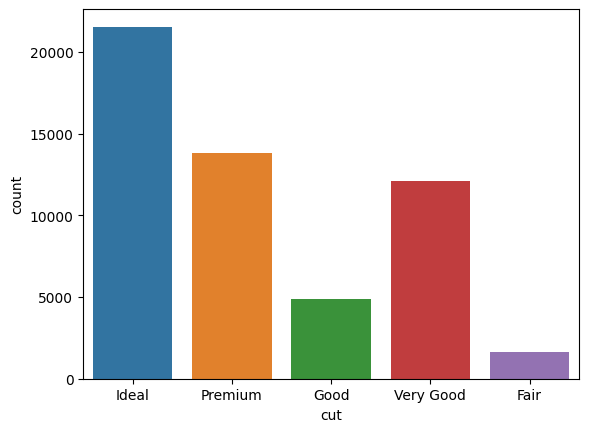

In [24]:
sns.countplot(data=diamond_df, x='cut')
plt.show()

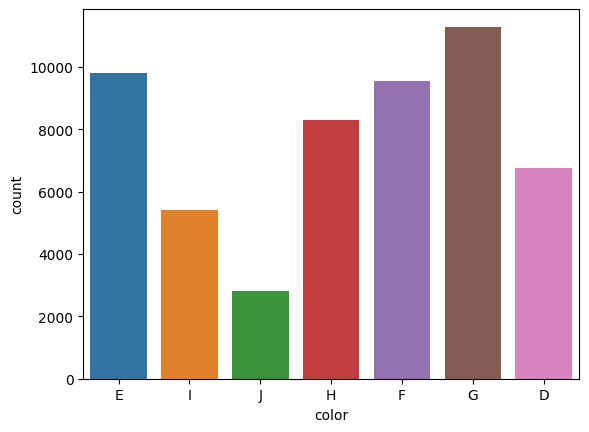

In [25]:
sns.countplot(data=diamond_df, x='color')
plt.show()

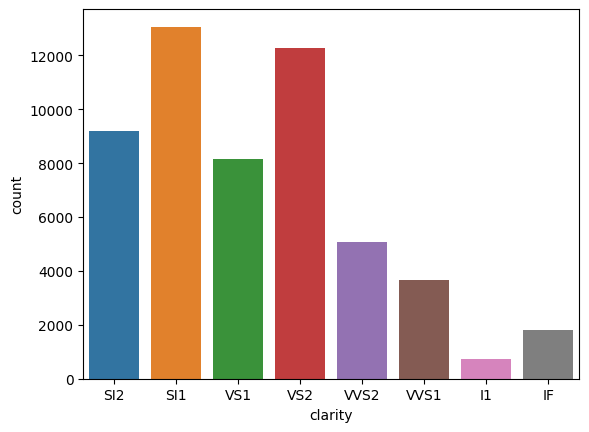

In [26]:
sns.countplot(data=diamond_df, x='clarity')
plt.show()

##Observed that
l1 is small 

In [27]:
ab=list(diamond_df['cut'].unique())
ab

['Ideal', 'Premium', 'Good', 'Very Good', 'Fair']

In [28]:
list(diamond_df.cut.unique())

['Ideal', 'Premium', 'Good', 'Very Good', 'Fair']

In [29]:
# Encode the ordinal categorical variable 'cut'
cut_mapping = {'Fair': 0, 'Good': 1, 'Very Good': 2,'Premium': 3, 'Ideal': 4}
diamond_df.cut = diamond_df.cut.map(cut_mapping)
diamond_df.head()


,carat,cut,color,clarity,depth,table,price,x,y,z
0,0.23,4,E,SI2,61.5,55.0,326,3.95,3.98,2.43
1,0.21,3,E,SI1,59.8,61.0,326,3.89,3.84,2.31
2,0.23,1,E,VS1,56.9,65.0,327,4.05,4.07,2.31
3,0.29,3,I,VS2,62.4,58.0,334,4.20,4.23,2.63
4,0.31,1,J,SI2,63.3,58.0,335,4.34,4.35,2.75


In [30]:
list(diamond_df.color.unique())


['E', 'I', 'J', 'H', 'F', 'G', 'D']

In [31]:
# Encoding the ordinal categorical variable 'color'
color_mapping = {'J': 0, 'I': 1, 'H': 2, 'G': 3, 'F': 4, 'E': 5, 'D': 6}
diamond_df.color = diamond_df.color.map(color_mapping)
diamond_df.head()

,carat,cut,color,clarity,depth,table,price,x,y,z
0,0.23,4,5,SI2,61.5,55.0,326,3.95,3.98,2.43
1,0.21,3,5,SI1,59.8,61.0,326,3.89,3.84,2.31
2,0.23,1,5,VS1,56.9,65.0,327,4.05,4.07,2.31
3,0.29,3,1,VS2,62.4,58.0,334,4.20,4.23,2.63
4,0.31,1,0,SI2,63.3,58.0,335,4.34,4.35,2.75


In [32]:
list(diamond_df.clarity.unique())

['SI2', 'SI1', 'VS1', 'VS2', 'VVS2', 'VVS1', 'I1', 'IF']

In [33]:
# Encoding the ordinal cateogircal variable 'clarity'
clarity_mapping = {'I1': 0, 'SI2': 1, 'SI1': 2, 'VS2': 3, 'VS1': 4, 'VVS2': 5, 'VVS1': 6, 'IF': 7}
diamond_df.clarity = diamond_df.clarity.map(clarity_mapping)

In [34]:
diamond_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 53940 entries, 0 to 53939
Data columns (total 10 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   carat    53940 non-null  float64
 1   cut      53940 non-null  int64  
 2   color    53940 non-null  int64  
 3   clarity  53940 non-null  int64  
 4   depth    53940 non-null  float64
 5   table    53940 non-null  float64
 6   price    53940 non-null  int64  
 7   x        53940 non-null  float64
 8   y        53940 non-null  float64
 9   z        53940 non-null  float64
dtypes: float64(6), int64(4)
memory usage: 4.1 MB


In [35]:
diamond_df = diamond_df.drop(diamond_df[diamond_df["x"]==0].index)
diamond_df = diamond_df.drop(diamond_df[diamond_df["y"]==0].index)
diamond_df = diamond_df.drop(diamond_df[diamond_df["z"]==0].index)

In [36]:
diamond_df = diamond_df[diamond_df['depth'] < diamond_df['depth'].quantile(0.99)]
diamond_df = diamond_df[diamond_df['table'] < diamond_df['table'].quantile(0.99)]
diamond_df = diamond_df[diamond_df['x'] < diamond_df['x'].quantile(0.99)]
diamond_df = diamond_df[diamond_df['y'] < diamond_df['y'].quantile(0.99)]
diamond_df = diamond_df[diamond_df['z'] < diamond_df['z'].quantile(0.99)]

In [37]:
diamond_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 51130 entries, 0 to 53939
Data columns (total 10 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   carat    51130 non-null  float64
 1   cut      51130 non-null  int64  
 2   color    51130 non-null  int64  
 3   clarity  51130 non-null  int64  
 4   depth    51130 non-null  float64
 5   table    51130 non-null  float64
 6   price    51130 non-null  int64  
 7   x        51130 non-null  float64
 8   y        51130 non-null  float64
 9   z        51130 non-null  float64
dtypes: float64(6), int64(4)
memory usage: 4.3 MB


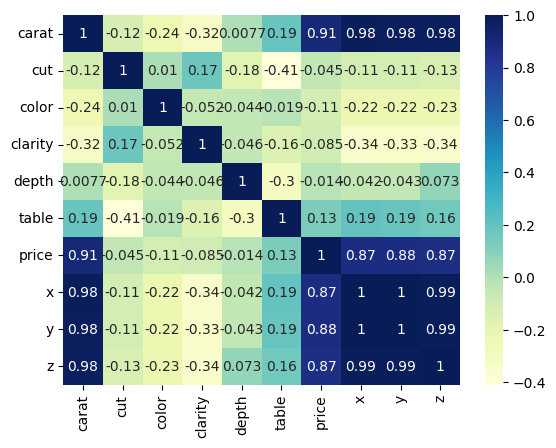

In [38]:
# plotting correlation heatmap
dataplot = sns.heatmap(diamond_df.corr(), cmap="YlGnBu", annot=True)
# displaying heatmap
plt.show()  

**Make Data ready for training**

splitting data and testing & transformation zone



In [39]:
model_df = diamond_df.copy()
X = model_df.drop(['price'], axis=1)
y = model_df['price']
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.2, random_state=0)
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size=0.25, random_state=0)

In [40]:
X.columns

Index(['carat', 'cut', 'color', 'clarity', 'depth', 'table', 'x', 'y', 'z'], dtype='object')

In [41]:
# Hyperparameter tuning
# xgb1 = XGBRegressor()
# parameters = {
#               'objective':['reg:squarederror'],
#               'learning_rate': [.0001, 0.001, .01],
#               'max_depth': [3, 5, 7],
#               'min_child_weight': [3,5,7],
#               'subsample': [0.1,0.5,1.0],
#               'colsample_bytree': [0.1, 0.5, 1.0],
#               'n_estimators': [500]}

# xgb_grid = GridSearchCV(xgb1,
#                         parameters,
#                         cv = 3,
#                         n_jobs = -1,
#                         verbose=0)

In [44]:
xgb1 = XGBRegressor()
history=xgb1.fit(X_train,y_train,verbose=True)
print("MAE:", mean_absolute_error(y_test, xgb1.predict(X_test)))
print("MSE:", mean_squared_error(y_test, xgb1.predict(X_test)))


MAE: 238.56105070451736
MSE: 201382.29134320974


In [45]:
xgb1.save_model('xgb_model.json')

In [52]:
# xgb_grid.fit(X_train, y_train,verbose=True)

In [ ]:


# xgb_cv = (xgb_grid.best_estimator_)

# eval_set = [(X_train, y_train),
#             (X_val, y_val)]

# fit_model = xgb_cv.fit(
#     X_train,
#     y_train,
#     eval_set=eval_set,
#     eval_metric='mae',
#     early_stopping_rounds=50,
#     verbose=True)


In [ ]:

# print("MAE:", mean_absolute_error(y_val, xgb_grid.predict(X_val)))
# print("MSE:", mean_squared_error(y_val, xgb_grid.predict(X_val)))
# print("R2:", r2_score(y_val, xgb_grid.predict(X_val)))

In [ ]:
# fit_model.save_model('xgb_model.json')

In [46]:
!pip install joblib


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [54]:
import joblib
# save the model to a file
joblib.dump(xgb1,'xgb_grid.joblib')


['xgb_grid.joblib']

In [51]:
from google.colab import files
files.download('xgb_grid.joblib')
files.download('xgb_model.json')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>